## 영상 색상처리

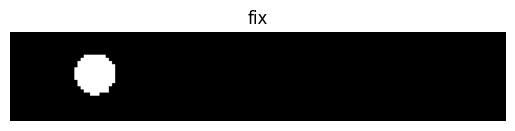

NG(공정 B의 의심)프레임: [1113 1114 1115 1139 1140 1141 1142 1145 1148 1152 1156 1157 1158 1163
 1164 1182 1183 1184 1193 1194 1205 1206 1207 1218 1219 1220 1221 1222
 1223 1224 1225 1226 1227 1228 1229 1230 1231 1232 1233 1234 1235 1236
 1237 1238 1239 1240 1241 1242 1243 1244 1245 1246 1247 1248 1249 1250
 1251 1252 1253 1254 1255 1256 1257 1258 1259 1260 1261 1262 1263 1264
 1265 1266 1267 1268 1269 1270 1271 1272 1273 1274 1275 1276 1277 1278
 1279 1280] 86


In [17]:
import cv2
import numpy as np
from sklearn.svm import OneClassSVM
import matplotlib.pyplot as plt

video_path = "D:\\kys\\public\\old_scada.mp4"
cap = cv2.VideoCapture(video_path)

def mask_time(frame):
    frame[54:94,433:445] = 0 # 검은색,  cv2에서는 y 와 x 가 거꾸로 
    frame[298:315,122:310] = 0 # 검은색, cv2에서는 y 와 x 가 거꾸로 
    return frame

def extract_feature(frame):
    frame = mask_time(frame)
    roi = frame[139:196, 129:445]

    hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)

    lower_blue = (80, 50, 50)
    upper_blue = (115, 255, 255)

    mask = cv2.inRange(hsv, lower_blue, upper_blue)
    mor = cv2.morphologyEx(mask ,cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
    feature = mor.flatten() / 255.0 # 정규 백터화
    # resized = cv2.resize(edge,(32, 32)) # 크기축소 (전체구조를 요약) 320 X 446 -> 32 X 32 로 바꿔서 속도향상, 메모리 절감
    return feature, mor

train_feature = []
test_feature = []
frame_idx = 0
while True:
    ret, frame = cap.read()
    if not ret: break

    feature, mor = extract_feature(frame)
    if frame_idx == 313:        
        plt.imshow(mor , cmap="gray")
        plt.title("fix")
        plt.axis("off")
        plt.show()
    if frame_idx <= 828:
        train_feature.append(feature)
    elif 828 < frame_idx < 1337:
        test_feature.append(feature)     
    frame_idx += 1 
cap.release()
X_train = np.array(train_feature)
X_test = np.array(test_feature)
# One - Class SVM 학습
ocsvm = OneClassSVM(kernel="rbf", gamma="auto", nu=0.05)
# 훈련
ocsvm.fit(X_train) 
# 이상 탐지
pred = ocsvm.predict(X_test) # 1:정상 , -1: 비정상
abnormal_idx = np.where(pred==-1)[0] + 828
print("NG(공정 B의 의심)프레임:", abnormal_idx, len(abnormal_idx) )


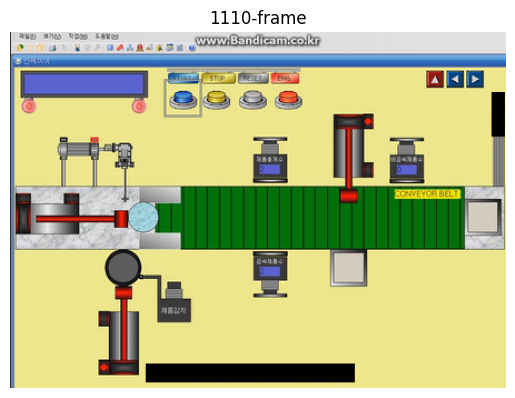

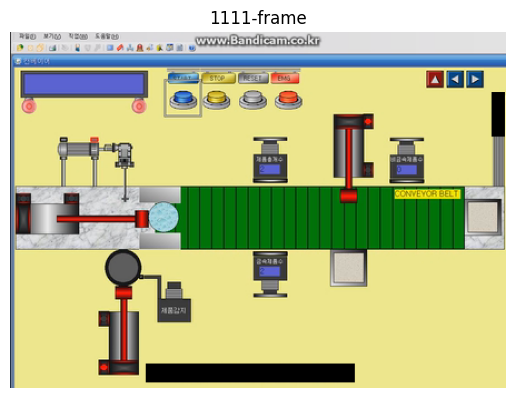

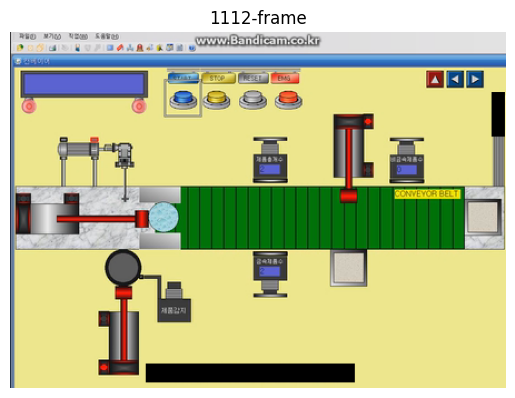

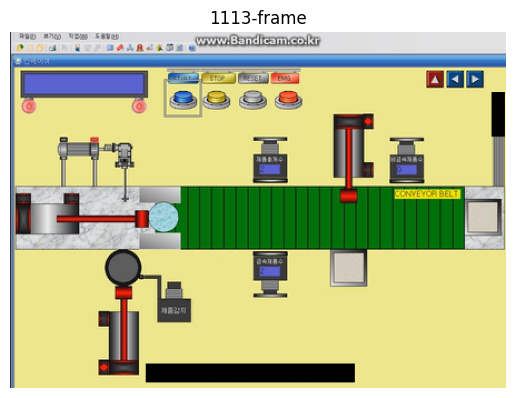

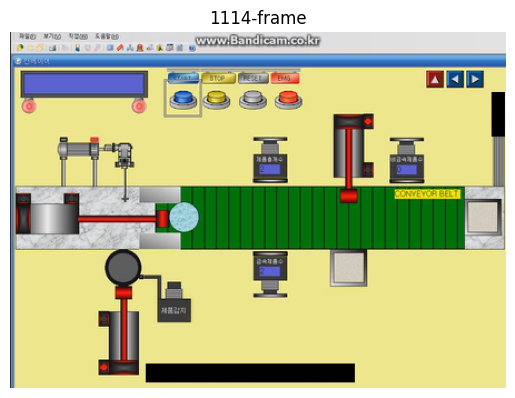

...

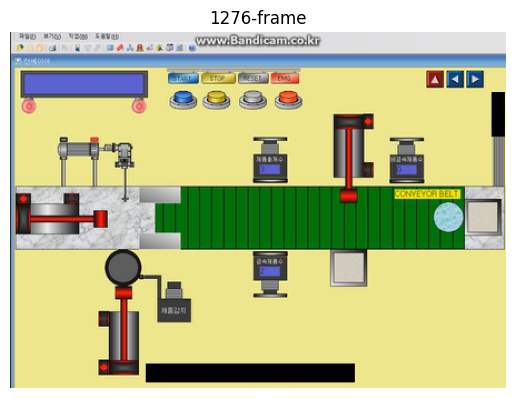

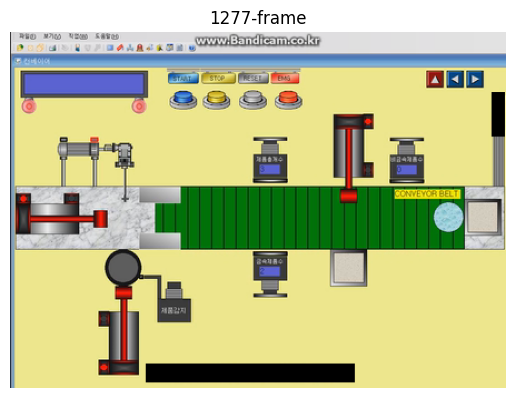

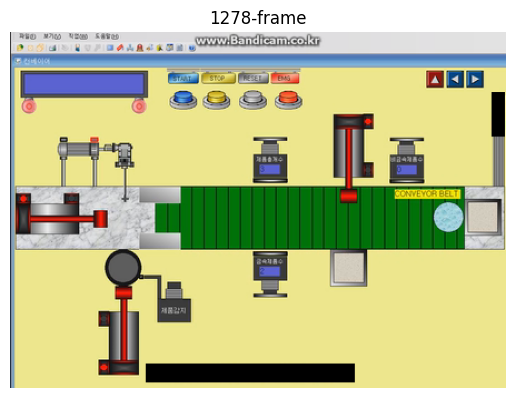

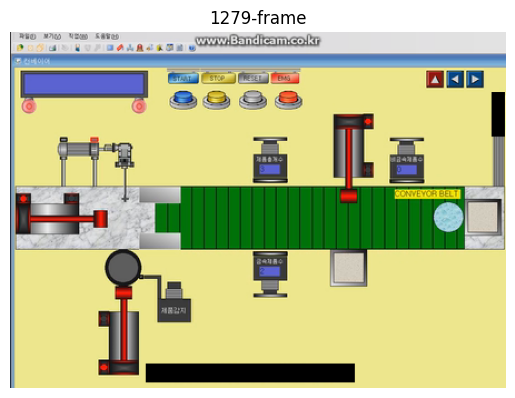

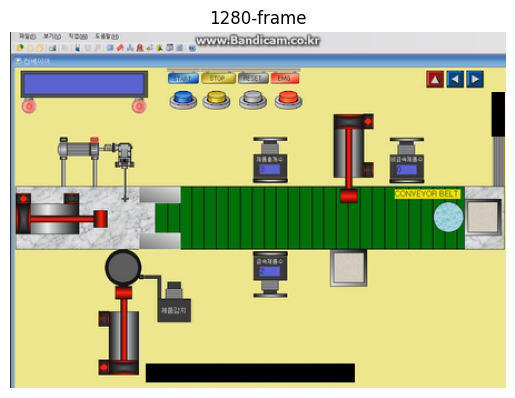

In [16]:
# 특정 프레임 보기
import matplotlib.pyplot as plt
cap = cv2.VideoCapture(video_path)
for position in abnormal_idx:
    cap.set(cv2.CAP_PROP_POS_FRAMES, position)
    _ , frame = cap.read()
    frame = mask_time(frame)
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.imshow(rgb)
    plt.title(f"{position}-frame")
    plt.axis("off")
    plt.show()
cap.release()